In [30]:
import pandas as pd
import pandera as pa
from pandera import Column, DataFrameSchema, Check

# Charger les données depuis le fichier CSV
df = pd.read_csv('C:/Users/SOW110579/Documents/mdsNAS/synced/data/raw/audible_uncleaned.csv', sep=',', quotechar='"', engine='python')

# Détecter les lignes avec un nombre incorrect de colonnes
correct_columns = 8
incorrect_rows = df[df.apply(lambda x: len(x) != correct_columns, axis=1)]

# Afficher les lignes incorrectes
print("Lignes incorrectes détectées :")
print(incorrect_rows)

# Corriger les lignes incorrectes (exemple de correction simple)
def correct_row(row):
    if len(row) > correct_columns:
        # Fusionner les colonnes supplémentaires
        row[0] = ','.join(row[:len(row) - correct_columns + 1])
        return row[len(row) - correct_columns + 1:]
    return row

df_corrected = df.apply(correct_row, axis=1, result_type='expand')

# Renommer les colonnes
df_corrected.columns = ["name", "author", "narrator", "time", "releasedate", "language", "stars", "price"]

# Nettoyer les colonnes 'author' et 'narrator'
df_corrected['author'] = df_corrected['author'].str.replace('Writtenby:', '', regex=False)
df_corrected['narrator'] = df_corrected['narrator'].str.replace('Narratedby:', '', regex=False)
df_corrected['name'] = df_corrected['name'].str.strip()

# Convertir la colonne 'time' en minutes (standardisation)
def convert_time_to_minutes(time_str):
    try:
        if 'and' in time_str:
            hrs, mins = time_str.split(' and ')
            hrs = int(hrs.split(' ')[0])
            mins = int(mins.split(' ')[0])
            return hrs * 60 + mins
        elif 'hrs' in time_str:
            hrs = int(time_str.split(' ')[0])
            return hrs * 60
        return int(time_str.split(' ')[0])
    except ValueError:
        return None  # ou une valeur par défaut comme 0

df_corrected['time_minutes'] = df_corrected['time'].apply(convert_time_to_minutes)

# Nettoyer release date
df_corrected['releasedate'] = pd.to_datetime(df_corrected['releasedate'], format='%d-%m-%y', errors='coerce')

# Nettoyer la colonne 'stars' (extraire uniquement la note)
df_corrected['stars'] = df_corrected['stars'].str.extract(r'(\d+(\.\d+)?)')[0].astype(float)
# Remplacer les valeurs nulles dans 'stars' par 0
df_corrected['stars'] = df_corrected['stars'].fillna(0)

# Supprimer les guillemets et les virgules de la colonne 'price'
def clean_price(price):
    try:
        return float(price.replace(',', '').replace('"', ''))
    except ValueError:
        return None  # ou une valeur par défaut comme 0

df_corrected['price'] = df_corrected['price'].apply(clean_price)

# Remplacer les valeurs nulles de price par 0
df_corrected['price'] = df_corrected['price'].fillna(0)

# Convertir la colonne 'language' en type 'category'
df_corrected['language'] = df_corrected['language'].astype('category')

# Afficher les premières lignes du DataFrame nettoyé
print(df_corrected.head())

# Description des données
print(df_corrected.describe(include='all'))

# Convertir la colonne 'stars' en float32
df_corrected['stars'] = df_corrected['stars'].astype('float32')

# Définir le schéma de validation
schema = DataFrameSchema({
    "name": Column(pa.String, checks=Check.str_length(1, 250)),
    "author": Column(pa.String, checks=Check.str_length(1, 250)),
    "narrator": Column(pa.String, checks=Check.str_length(1, 250)),
    "time": Column(pa.String, checks=Check.str_length(1, 250)),
    "releasedate": Column(pa.DateTime, checks=Check.in_range("1998-01-01", "2025-12-31")),
    "language": Column(pa.Category, checks=Check.str_length(1, 20)),
    "stars": Column(pa.Float32, checks=Check.in_range(0, 5)),
    "price": Column(pa.Float64, checks=Check.in_range(0, 100)),
    "time_minutes": Column(pa.UInt16, checks=Check.in_range(0, 9000))
})

# Valider le DataFrame
df_validated = pd.DataFrame()
try:
    df_validated = schema.validate(df_corrected)
    print("Validation réussie !")
except pa.errors.SchemaError as e:
    print(f"Erreur de validation : {e}")
    df_validated = None  # Assurez-vous que df_validated est défini même en cas d'erreur

# Afficher les premières lignes du DataFrame validé
if df_validated is not None:
    print(df_validated.head())
else:
    print("La validation a échoué, df_validated n'est pas défini.")

Lignes incorrectes détectées :
Empty DataFrame
Columns: [name, author, narrator, time, releasedate, language, stars, price]
Index: []
                                         name           author  \
0                  Geronimo Stilton #11 & #12  GeronimoStilton   
1                            The Burning Maze      RickRiordan   
2                                The Deep End       JeffKinney   
3                        Daughter of the Deep      RickRiordan   
4  The Lightning Thief: Percy Jackson, Book 1      RickRiordan   

         narrator                time releasedate language  stars  price  \
0      BillLobely   2 hrs and 20 mins  2008-08-04  English    5.0  468.0   
1   RobbieDaymond   13 hrs and 8 mins  2018-05-01  English    4.5  820.0   
2      DanRussell    2 hrs and 3 mins  2020-11-06  English    4.5  410.0   
3  SoneelaNankani  11 hrs and 16 mins  2021-10-05  English    4.5  615.0   
4  JesseBernstein              10 hrs  2010-01-13  English    4.5  820.0   

   time_minu

TypeError: 'Axes' object is not subscriptable

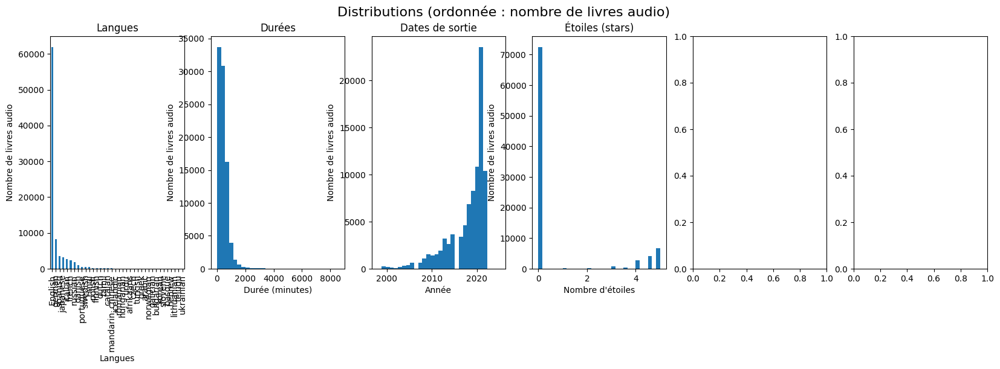

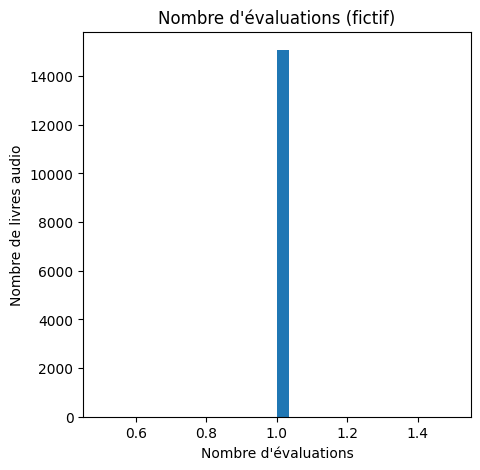

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Créer une figure avec plusieurs sous-graphes (2 lignes, 3 colonnes)
fig, axes = plt.subplots(1, 6, figsize=(20, 5))
fig.suptitle("Distributions (ordonnée : nombre de livres audio)", fontsize=16)

# Premier graphe : Distribution des langues
df_corrected['language'].value_counts().plot(kind='bar', ax=axes[0])
axes[0].set_title('Langues')
axes[0].set_xlabel('Langues')
axes[0].set_ylabel('Nombre de livres audio')

# Deuxième graphe : Distribution des durées en minutes
df_corrected['time_minutes'].plot(kind='hist', bins=30, ax=axes[1])
axes[1].set_title('Durées')
axes[1].set_xlabel('Durée (minutes)')
axes[1].set_ylabel('Nombre de livres audio')

# Troisième graphe : Distribution des dates de sortie
df_corrected['releasedate'].dt.year.plot(kind='hist', bins=30, ax=axes[2])
axes[2].set_title('Dates de sortie')
axes[2].set_xlabel('Année')
axes[2].set_ylabel('Nombre de livres audio')

# Quatrième graphe : Distribution des étoiles (stars)
df_corrected['stars'].plot(kind='hist', bins=30, ax=axes[3])
axes[3].set_title('Étoiles (stars)')
axes[3].set_xlabel('Nombre d\'étoiles')
axes[3].set_ylabel('Nombre de livres audio')

# Créer une colonne fictive 'num_reviews' en fonction des étoiles
# Si 'stars' est supérieure à 0, alors au moins 1 évaluation
df_corrected['num_reviews'] = np.where(df_corrected['stars'] > 0,1,0)

# Filtrer les livres ayant au moins une évaluation (> 0)
df_with_reviews = df_corrected[df_corrected['num_reviews'] > 0]

# Maintenant tu peux afficher le cinquième graphe en fonction de la colonne num_reviews
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

# Afficher l'histogramme du nombre d'évaluations (fictif ici basé sur les étoiles)
df_with_reviews['num_reviews'].plot(kind='hist', bins=30, ax=axes)
axes.set_title("Nombre d'évaluations (fictif)")
axes.set_xlabel('Nombre d\'évaluations')
axes.set_ylabel('Nombre de livres audio')

# Sixième graphe : Distribution des prix
df_corrected['price'].plot(kind='hist', bins=30, ax=axes[5])
axes[5].set_title('Prix')
axes[5].set_xlabel('Prix ($)')
axes[5].set_ylabel('Nombre de livres audio')

# Quatrième graphe : Distribution des étoiles (stars) après filtrage des étoiles à 0
df_corrected['starssup0'] = np.where(df_corrected['stars'] > 0,1,0)
df_corrected['starssup0'].plot(kind='hist', bins=30, ax=axes[3])
axes[3].set_title('Étoiles (stars sans 0)')
axes[3].set_xlabel('Nombre d\'étoiles')
axes[3].set_ylabel('Nombre de livres audio')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


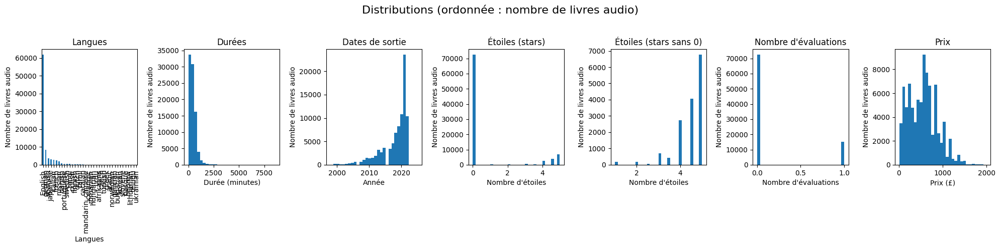

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer une figure avec plusieurs sous-graphes (1 ligne, 6 colonnes)
fig, axes = plt.subplots(1, 7, figsize=(20, 5))
fig.suptitle("Distributions (ordonnée : nombre de livres audio)", fontsize=16)

# Premier graphe : Distribution des langues
df_corrected['language'].value_counts().plot(kind='bar', ax=axes[0])
axes[0].set_title('Langues')
axes[0].set_xlabel('Langues')
axes[0].set_ylabel('Nombre de livres audio')

# Deuxième graphe : Distribution des durées en minutes
df_corrected['time_minutes'].plot(kind='hist', bins=30, ax=axes[1])
axes[1].set_title('Durées')
axes[1].set_xlabel('Durée (minutes)')
axes[1].set_ylabel('Nombre de livres audio')

# Troisième graphe : Distribution des dates de sortie
df_corrected['releasedate'].dt.year.plot(kind='hist', bins=30, ax=axes[2])
axes[2].set_title('Dates de sortie')
axes[2].set_xlabel('Année')
axes[2].set_ylabel('Nombre de livres audio')

# Quatrième graphe : Distribution des étoiles (stars)
df_corrected['stars'].plot(kind='hist', bins=30, ax=axes[3])
axes[3].set_title('Étoiles (stars)')
axes[3].set_xlabel('Nombre d\'étoiles')
axes[3].set_ylabel('Nombre de livres audio')

# Créer une nouvelle colonne 'num_reviews' qui compte les évaluations valides
#df_corrected['stars2'] = df_corrected['stars'].apply(lambda x: 1 if pd.notnull(x) and x != 0 else 0)
df_stars_filtered = df_corrected[df_corrected['stars'] != 0]
# Quatrième graphe : Distribution des étoiles (stars)
df_stars_filtered['stars'].plot(kind='hist', bins=30, ax=axes[4])
axes[4].set_title('Étoiles (stars sans 0)')
axes[4].set_xlabel('Nombre d\'étoiles')
axes[4].set_ylabel('Nombre de livres audio')

# Créer une nouvelle colonne 'num_reviews' qui compte les évaluations valides
df_corrected['num_reviews2'] = df_corrected['stars'].apply(lambda x: 1 if pd.notnull(x) and x != 0 else 0)
#df_filtered = df_corrected[df_corrected['num_reviews2'] != 0]
# Cinquième graphe : Distribution du nombre d'évaluations
df_corrected['num_reviews2'].plot(kind='hist', bins=30, ax=axes[5])
axes[5].set_title("Nombre d'évaluations")
axes[5].set_xlabel('Nombre d\'évaluations')
axes[5].set_ylabel('Nombre de livres audio')

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_price_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]
# Sixième graphe : Distribution des prix
df_price_filtered['price'].plot(kind='hist', bins=30, ax=axes[6])
axes[6].set_title('Prix')
axes[6].set_xlabel('Prix (£)')
axes[6].set_ylabel('Nombre de livres audio')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



Langues disponibles :  ['English', 'german', 'spanish', 'japanese', 'italian', 'french', 'russian', 'danish', 'portuguese', 'swedish', 'Hindi', 'polish', 'finnish', 'dutch', 'tamil', 'catalan', 'mandarin_chinese', 'icelandic', 'romanian', 'hungarian', 'urdu', 'afrikaans', 'czech', 'turkish', 'greek', 'arabic', 'norwegian', 'galician', 'bulgarian', 'korean', 'slovene', 'basque', 'hebrew', 'lithuanian', 'telugu', 'ukrainian']


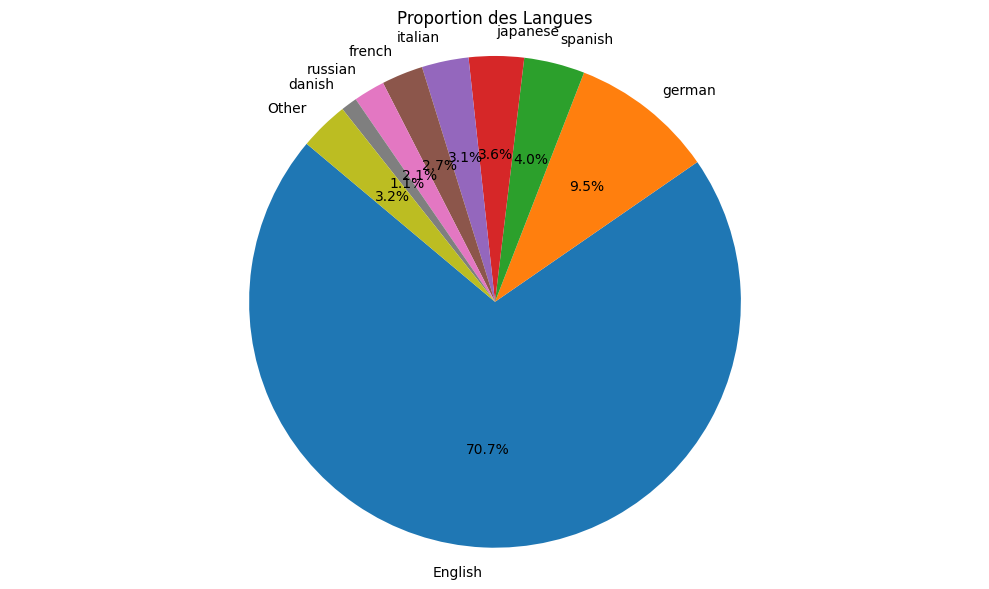

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Compter les occurrences de chaque langue dans la colonne 'df_corrected_language'
df_language_counts = df_corrected['language'].value_counts()
# Vérifier les langues disponibles
print("Langues disponibles : ", df_language_counts.index.tolist())

# Regrouper les langues spécifiées et mettre les autres dans 'Other'
df_languages_to_include = ['English', 'german', 'spanish', 'japanese', 'italian', 'french', 'russian', 'danish']

# Garder uniquement les langues qui sont dans le DataFrame
valid_languages = [lang for lang in df_languages_to_include if lang in df_language_counts.index]

# Ajouter 'Other' pour les langues non spécifiées
df_language_counts['Other'] = df_language_counts[~df_language_counts.index.isin(valid_languages)].sum()
df_language_counts = df_language_counts[valid_languages + ['Other']]

# Créer le diagramme

plt.figure(figsize=(10, 6))
plt.pie(df_language_counts.values, labels=df_language_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion des Langues')
plt.axis('equal')  # Égaliser les axes pour un cercle parfait
plt.tight_layout()
plt.show()

Langues disponibles pour les livres évalués :  ['English', 'Hindi', 'tamil', 'german', 'urdu', 'spanish', 'french', 'italian', 'danish', 'arabic', 'polish', 'russian', 'swedish', 'afrikaans', 'finnish', 'dutch', 'czech', 'catalan', 'basque', 'bulgarian', 'japanese', 'icelandic', 'hungarian', 'hebrew', 'galician', 'greek', 'korean', 'lithuanian', 'romanian', 'portuguese', 'mandarin_chinese', 'norwegian', 'slovene', 'telugu', 'turkish', 'ukrainian']


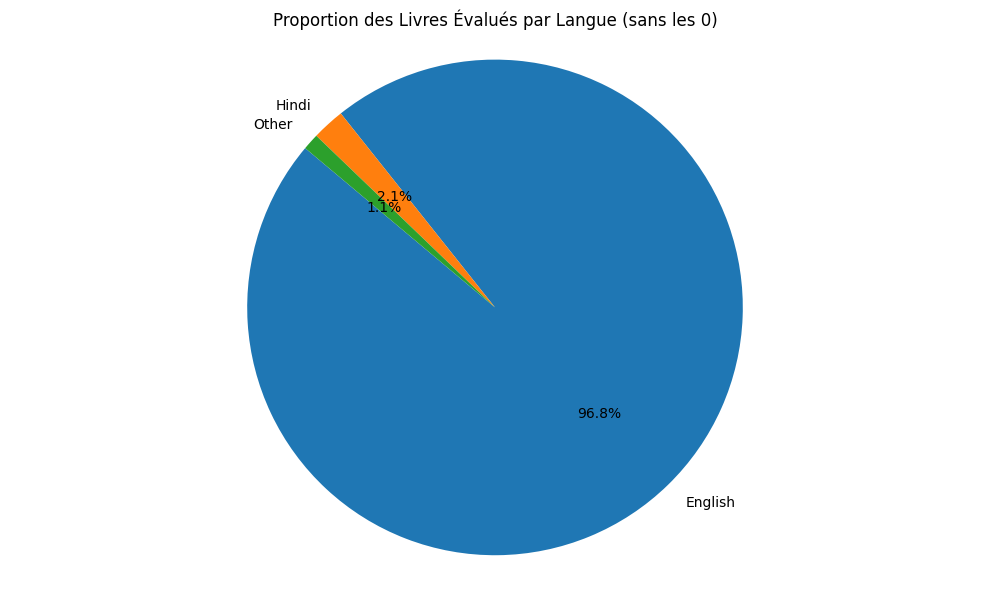

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Compter les occurrences de livres évalués par langue dans la colonne 'df_corrected_language'
# Écarter les valeurs de rating de 0 et les valeurs nulles
df_evaluated_counts = df_corrected[df_corrected['stars'].notnull() & (df_corrected['stars'] > 0)]['language'].value_counts()

# Vérifier les langues disponibles
print("Langues disponibles pour les livres évalués : ", df_evaluated_counts.index.tolist())

# Regrouper les langues spécifiées et mettre les autres dans 'Other'
df_languages_to_include = ['English', 'Hindi']

# Garder uniquement les langues qui sont dans le DataFrame
valid_languages = [lang for lang in df_languages_to_include if lang in df_evaluated_counts.index]

# Ajouter 'Other' pour les langues non spécifiées
df_evaluated_counts['Other'] = df_evaluated_counts[~df_evaluated_counts.index.isin(valid_languages)].sum()
df_evaluated_counts = df_evaluated_counts[valid_languages + ['Other']]

# Créer le diagramme
plt.figure(figsize=(10, 6))
plt.pie(df_evaluated_counts.values, labels=df_evaluated_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion des Livres Évalués par Langue (sans les 0)')
plt.axis('equal')  # Égaliser les axes pour un cercle parfait
plt.tight_layout()
plt.show()


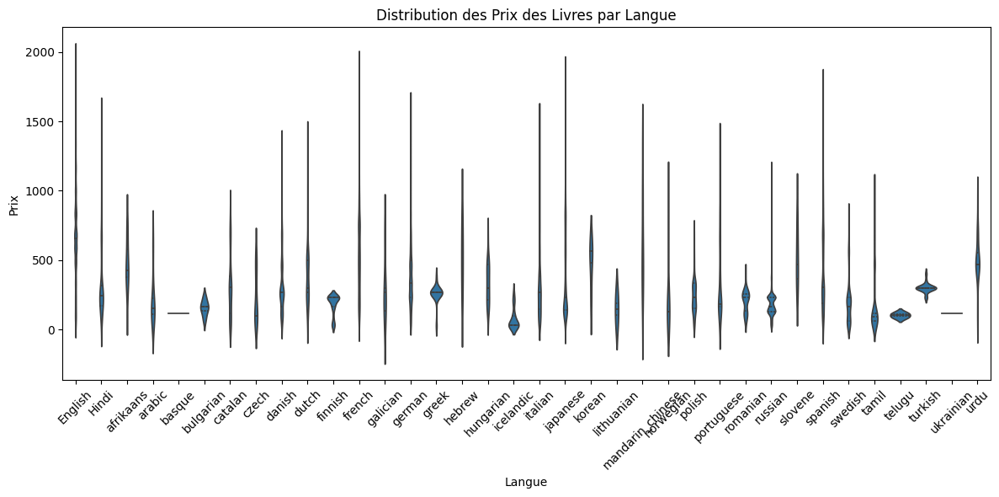

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en violon sans palette
plt.figure(figsize=(12, 6))
sns.violinplot(x='language', y='price', data=df_filtered, inner='quartile')

# Personnaliser le graphique
plt.title('Distribution des Prix des Livres par Langue')
plt.xlabel('Langue')
plt.ylabel('Prix')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\SOW110579\AppData\Local\Temp\ipykernel_37360\872991587.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='language', y='price', data=df_filtered, inner='quartile', palette='muted')


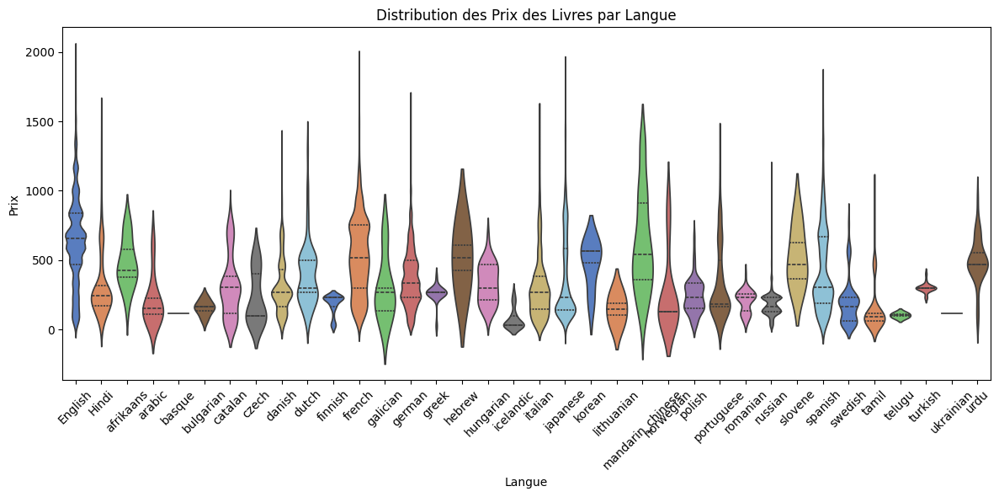

In [58]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en violon
plt.figure(figsize=(12, 6))
sns.violinplot(x='language', y='price', data=df_filtered, inner='quartile', palette='muted')

# Personnaliser le graphique
plt.title('Distribution des Prix des Livres par Langue')
plt.xlabel('Langue')
plt.ylabel('Prix')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


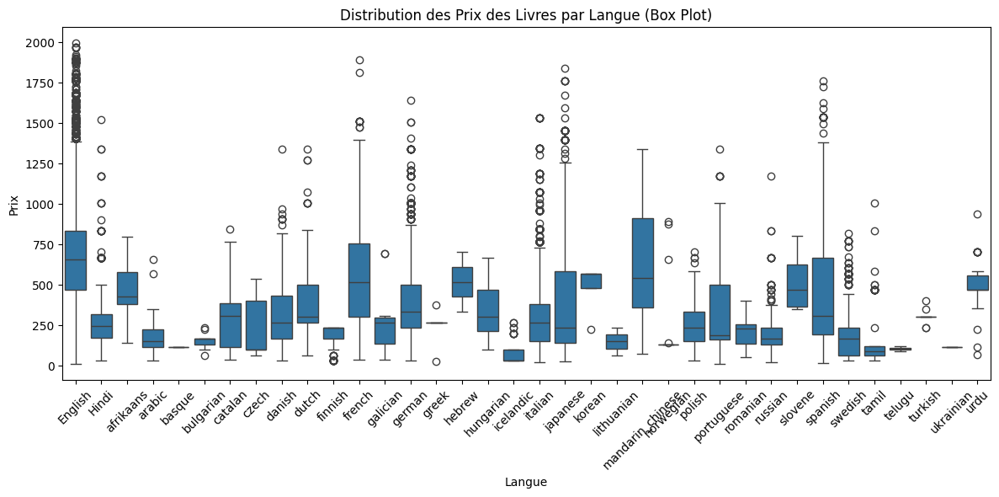

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en boîte à moustaches
plt.figure(figsize=(12, 6))
sns.boxplot(x='language', y='price', data=df_filtered)

# Personnaliser le graphique
plt.title('Distribution des Prix des Livres par Langue (Box Plot)')
plt.xlabel('Langue')
plt.ylabel('Prix')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\SOW110579\AppData\Local\Temp\ipykernel_37360\1248938417.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='stars', y='price', data=df_filtered, inner='quartile', palette='muted')


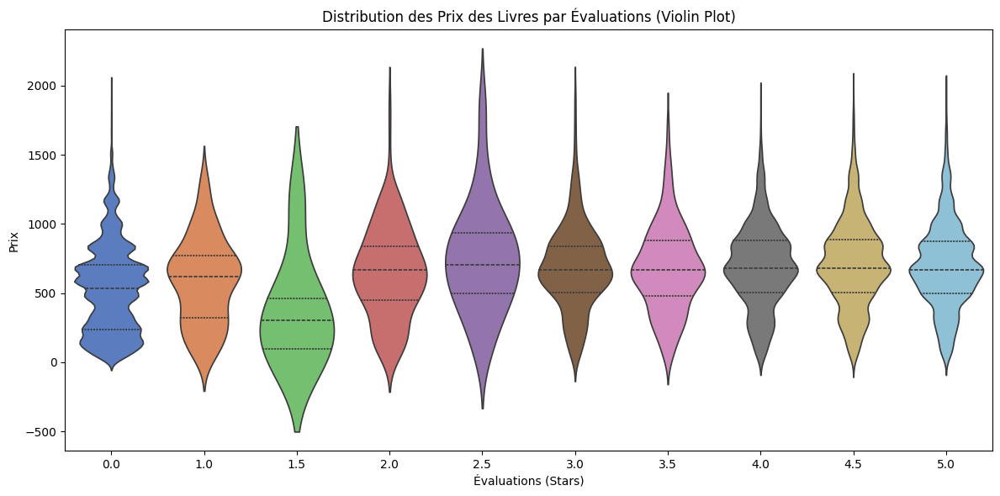

In [60]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en violon
plt.figure(figsize=(12, 6))
sns.violinplot(x='stars', y='price', data=df_filtered, inner='quartile', palette='muted')

# Personnaliser le graphique
plt.title('Distribution des Prix des Livres par Évaluations (Violin Plot)')
plt.xlabel('Évaluations (Stars)')
plt.ylabel('Prix')
plt.tight_layout()
plt.show()


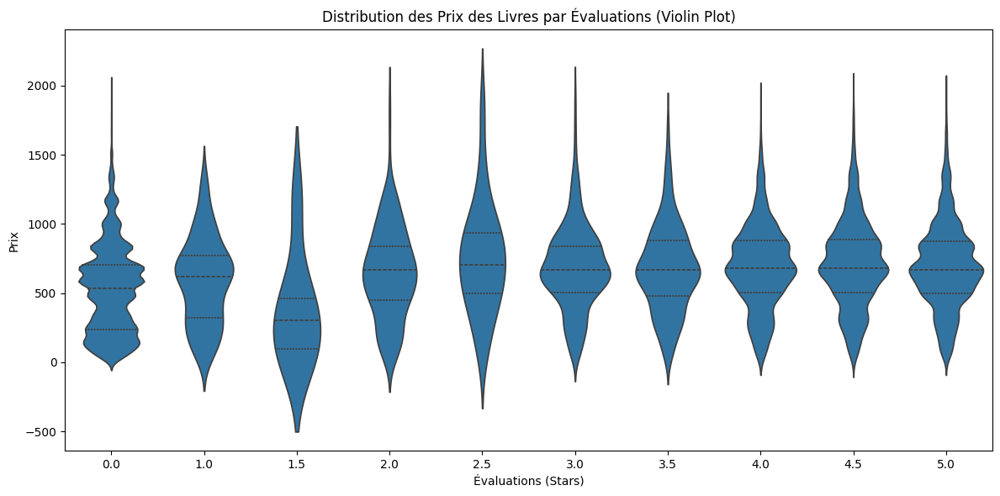

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en violon
plt.figure(figsize=(12, 6))
sns.violinplot(x='stars', y='price', data=df_filtered, inner='quartile')

# Personnaliser le graphique
plt.title('Distribution des Prix des Livres par Évaluations (Violin Plot)')
plt.xlabel('Évaluations (Stars)')
plt.ylabel('Prix')
plt.tight_layout()
plt.show()


In [66]:
!pip install plotly


   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
    --------------------------------------- 0.3/19.1 MB ? eta -:--:--
   - -------------------------------------- 0.5/19.1 MB 2.1 MB/s eta 0:00:09
   -- ------------------------------------- 1.0/19.1 MB 2.0 MB/s eta 0:00:09
   --- ------------------------------------ 1.6/19.1 MB 2.0 MB/s eta 0:00:09
   --- ------------------------------------ 1.8/19.1 MB 2.0 MB/s eta 0:00:09
   ---- ----------------------------------- 2.4/19.1 MB 2.0 MB/s eta 0:00:09
   ------ --------------------------------- 2.9/19.1 MB 2.0 MB/s eta 0:00:08
   ------ --------------------------------- 3.1/19.1 MB 2.1 MB/s eta 0:00:08
   ------- -------------------------------- 3.7/19.1 MB 2.0 MB/s eta 0:00:08
   -------- ------------------------------- 4.2/19.1 MB 2.0 MB/s eta 0:00:08
   --------- ------------------------------ 4.5/19.1 MB 2.0 MB/s eta 0:00:08
   ---------- ----------------------------- 5.0/19.1 MB 2.0 MB/s eta 0:00:07
   ----------

In [67]:
import plotly.express as px
import pandas as pd

# Filtrer les livres dont le prix est compris entre 0 et 2000
df_filtered = df_corrected[(df_corrected['price'] > 0) & (df_corrected['price'] <= 2000)]

# Créer le graphique en violon avec Plotly
fig = px.violin(df_filtered, x='stars', y='price', box=True, points='all', 
                 title='Distribution des Prix des Livres par Évaluations (Violin Plot)',
                 labels={'stars': 'Évaluations (Stars)', 'price': 'Prix'},
                 color='stars', # Ajout de la couleur par étoiles (facultatif)
                 )

# Afficher le graphique
fig.show()


In [71]:
!pip install scikit-learn
from sklearn.model_selection import train_test_split

# Diviser le jeu de données en trois parties : entraînement (80%), test (10%) et évaluation (10%)
audible_train, audible_temp, y_train, y_temp = train_test_split(df_corrected.drop(columns=['stars']), df_corrected['stars'], test_size=0.2, random_state=42)
audible_test, audible_eval, y_test, y_eval = train_test_split(audible_temp, y_temp, test_size=0.5, random_state=42)

print(f"Taille de l'ensemble d'entraînement : {len(audible_train)}")
print(f"Taille de l'ensemble de test : {len(audible_test)}")
print(f"Taille de l'ensemble d'évaluation : {len(audible_eval)}")

Taille de l'ensemble d'entraînement : 69991
Taille de l'ensemble de test : 8749
Taille de l'ensemble d'évaluation : 8749


In [72]:
!pip install pyarrow
# Sauvegarder les ensembles de données
audible_train.to_parquet('audible_train.parquet')
audible_test.to_parquet('audible_test.parquet')
audible_eval.to_parquet('audible_eval.parquet')

print("Les fichiers ont été sauvegardés avec succès.")

   ---------------------------------------- 0.0/25.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/25.1 MB ? eta -:--:--
    --------------------------------------- 0.5/25.1 MB 1.7 MB/s eta 0:00:15
   - -------------------------------------- 0.8/25.1 MB 1.3 MB/s eta 0:00:19
   - -------------------------------------- 1.0/25.1 MB 1.5 MB/s eta 0:00:17
   -- ------------------------------------- 1.6/25.1 MB 1.6 MB/s eta 0:00:15
   -- ------------------------------------- 1.8/25.1 MB 1.7 MB/s eta 0:00:14
   --- ------------------------------------ 2.4/25.1 MB 1.7 MB/s eta 0:00:14
   ---- ----------------------------------- 2.9/25.1 MB 1.8 MB/s eta 0:00:13
   ----- ---------------------------------- 3.1/25.1 MB 1.8 MB/s eta 0:00:13
   ----- ---------------------------------- 3.7/25.1 MB 1.9 MB/s eta 0:00:12
   ------ --------------------------------- 4.2/25.1 MB 1.9 MB/s eta 0:00:12
   ------- -------------------------------- 4.5/25.1 MB 1.9 MB/s eta 0:00:11
   ------- --